In [1]:
# ============================================
# CELL 1 - IMPORT LIBRARIES
# ============================================

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from pathlib import Path
from ultralytics import YOLO

print("Libraries imported successfully.")


Libraries imported successfully.


In [2]:
# ============================================
# CELL 2 - PROJECT PATHS
# ============================================

PROJECT_DIR = Path.cwd()

MODELS_DIR = PROJECT_DIR / "models"
VIDEOS_DIR = PROJECT_DIR / "videos"
OUTPUT_DIR = PROJECT_DIR / "outputs"

MODELS_DIR.mkdir(exist_ok=True)
VIDEOS_DIR.mkdir(exist_ok=True)
OUTPUT_DIR.mkdir(exist_ok=True)

print("Project directory:", PROJECT_DIR)
print("Models directory :", MODELS_DIR)
print("Videos directory :", VIDEOS_DIR)
print("Output directory :", OUTPUT_DIR)

Project directory: C:\Users\lenovo\downloads\ANPR_Traffic_AI
Models directory : C:\Users\lenovo\downloads\ANPR_Traffic_AI\models
Videos directory : C:\Users\lenovo\downloads\ANPR_Traffic_AI\videos
Output directory : C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs


In [3]:
# ============================================
# CELL 3 - LOAD FINAL VEHICLE DETECTION MODEL
# ============================================

VEHICLE_MODEL_PATH = (
    MODELS_DIR /
    "vehicle_detection_best.pt"
)

if not VEHICLE_MODEL_PATH.exists():
    raise FileNotFoundError(
        f"Vehicle detection model not found:\n{VEHICLE_MODEL_PATH}\n"
        "Run Notebook 1 first."
    )

vehicle_model = YOLO(
    str(VEHICLE_MODEL_PATH)
)

print("Final vehicle detection model loaded successfully.")
print("Model:", VEHICLE_MODEL_PATH)

print("\nModel classes:")
print(vehicle_model.names)

Final vehicle detection model loaded successfully.
Model: C:\Users\lenovo\downloads\ANPR_Traffic_AI\models\vehicle_detection_best.pt

Model classes:
{0: 'Ambulance', 1: 'Bus', 2: 'Car', 3: 'Truck'}


In [4]:
# ============================================
# CELL 4 - VEHICLE CLASSES
# ============================================

VEHICLE_CLASSES = {
    "Ambulance",
    "Bus",
    "Car",
    "Truck"
}

print("Vehicle classes used for tracking:")
print(sorted(VEHICLE_CLASSES))

Vehicle classes used for tracking:
['Ambulance', 'Bus', 'Car', 'Truck']


In [5]:
# ============================================
# CELL 5 - CHECK VIDEO FILES
# ============================================

video_extensions = [
    "*.mp4",
    "*.avi",
    "*.mov",
    "*.mkv"
]

video_files = []

for extension in video_extensions:

    video_files.extend(
        VIDEOS_DIR.glob(extension)
    )

print(
    "Videos found:",
    len(video_files)
)

for video in video_files:

    print(
        video.name
    )

Videos found: 3
cam_1.mp4
North-East.mp4
viofo.mp4


In [6]:
# ============================================
# CELL 6 - VIDEO INFORMATION
# ============================================

video_info = {}

for video_path in video_files:

    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        print(f"Could not open: {video_path.name}")
        continue

    fps = cap.get(cv2.CAP_PROP_FPS)
    frames = int(
        cap.get(cv2.CAP_PROP_FRAME_COUNT)
    )
    width = int(
        cap.get(cv2.CAP_PROP_FRAME_WIDTH)
    )
    height = int(
        cap.get(cv2.CAP_PROP_FRAME_HEIGHT)
    )

    duration = (
        frames / fps
        if fps > 0
        else 0
    )

    video_info[video_path.stem] = {
        "fps": fps,
        "frames": frames,
        "width": width,
        "height": height,
        "duration_sec": duration
    }

    cap.release()

    print(f"\n{video_path.name}")
    print(f"Resolution : {width} x {height}")
    print(f"FPS        : {fps:.2f}")
    print(f"Frames     : {frames}")
    print(f"Duration   : {duration:.2f} seconds")

print("\nVideo information stored successfully.")


cam_1.mp4
Resolution : 1280 x 720
FPS        : 25.00
Frames     : 615
Duration   : 24.60 seconds

North-East.mp4
Resolution : 1920 x 1080
FPS        : 30.00
Frames     : 1799
Duration   : 59.97 seconds

viofo.mp4
Resolution : 1920 x 1080
FPS        : 10.00
Frames     : 223
Duration   : 22.30 seconds

Video information stored successfully.


In [7]:
TEST_VIDEO = VIDEOS_DIR / "viofo.mp4"

if not TEST_VIDEO.exists():
    raise FileNotFoundError(f"Video not found: {TEST_VIDEO}")

print("Test camera:", TEST_VIDEO.name)

Test camera: viofo.mp4


In [8]:
# ============================================
# CELL 8 - VEHICLE DETECTION + TRACKING TEST
# ============================================

cap = cv2.VideoCapture(str(TEST_VIDEO))

if not cap.isOpened():
    raise RuntimeError(
        f"Could not open video: {TEST_VIDEO}"
    )

print("Testing video:", TEST_VIDEO.name)
print("Model classes:", vehicle_model.names)

frame_count = 0
max_frames = 50

detection_count = 0
tracking_count = 0

track_records = []

while frame_count < max_frames:

    success, frame = cap.read()

    if not success:
        break

    # ----------------------------------------
    # FIRST: NORMAL DETECTION
    # ----------------------------------------

    results = vehicle_model.predict(
        source=frame,
        conf=0.05,
        imgsz=640,
        verbose=False
    )

    result = results[0]

    num_boxes = (
        len(result.boxes)
        if result.boxes is not None
        else 0
    )

    if num_boxes > 0:
        detection_count += num_boxes

    # ----------------------------------------
    # SECOND: TRACKING
    # ----------------------------------------

    track_results = vehicle_model.track(
        source=frame,
        persist=True,
        tracker="bytetrack.yaml",
        conf=0.05,
        imgsz=640,
        verbose=False
    )

    track_result = track_results[0]

    if (
        track_result.boxes is not None
        and len(track_result.boxes) > 0
    ):

        boxes = (
            track_result.boxes.xyxy
            .cpu()
            .numpy()
        )

        classes = (
            track_result.boxes.cls
            .cpu()
            .numpy()
        )

        # Check whether tracker assigned IDs
        if track_result.boxes.id is not None:

            track_ids = (
                track_result.boxes.id
                .cpu()
                .numpy()
                .astype(int)
            )

            tracking_count += len(track_ids)

            for box, cls, track_id in zip(
                boxes,
                classes,
                track_ids
            ):

                class_name = (
                    vehicle_model.names[int(cls)]
                )

                print(
                    f"Frame {frame_count}: "
                    f"ID={track_id}, "
                    f"class={class_name}"
                )

                # Do not filter classes yet.
                # First verify what our model actually predicts.

                x1, y1, x2, y2 = (
                    box.astype(int)
                )

                track_records.append({
                    "camera": TEST_VIDEO.stem,
                    "frame": frame_count,
                    "track_id": int(track_id),
                    "vehicle_type": class_name,
                    "x1": x1,
                    "y1": y1,
                    "x2": x2,
                    "y2": y2
                })

    frame_count += 1

cap.release()

tracks_df = pd.DataFrame(track_records)

print("\n========================================")
print("CELL 8 DIAGNOSTIC RESULT")
print("========================================")

print("Frames processed       :", frame_count)
print("Raw detections         :", detection_count)
print("Tracking records       :", tracking_count)
print("Final tracking records :", len(tracks_df))

print("\nModel classes:")
print(vehicle_model.names)

if not tracks_df.empty:

    print(
        "\nUnique track IDs:",
        tracks_df["track_id"].nunique()
    )

    print("\nPredicted vehicle classes:")
    print(
        tracks_df["vehicle_type"]
        .value_counts()
    )

    display(
        tracks_df.head(10)
    )

else:

    print("\n⚠️ NO TRACK RECORDS GENERATED.")

    if detection_count == 0:
        print(
            "❌ Vehicle model is not detecting "
            "anything in this video."
        )

    elif tracking_count == 0:
        print(
            "❌ Detection works, but ByteTrack "
            "is not assigning track IDs."
        )

Testing video: viofo.mp4
Model classes: {0: 'Ambulance', 1: 'Bus', 2: 'Car', 3: 'Truck'}
Frame 0: ID=1, class=Car
Frame 14: ID=4, class=Car
Frame 15: ID=4, class=Car
Frame 17: ID=6, class=Car
Frame 17: ID=7, class=Car
Frame 17: ID=4, class=Car
Frame 18: ID=6, class=Car
Frame 18: ID=7, class=Car
Frame 18: ID=4, class=Car
Frame 19: ID=6, class=Car
Frame 19: ID=4, class=Car
Frame 20: ID=6, class=Car
Frame 20: ID=4, class=Car
Frame 21: ID=6, class=Car
Frame 21: ID=4, class=Car
Frame 22: ID=6, class=Car
Frame 23: ID=6, class=Car
Frame 24: ID=6, class=Car
Frame 25: ID=6, class=Car
Frame 26: ID=6, class=Car
Frame 27: ID=6, class=Car
Frame 28: ID=6, class=Car
Frame 29: ID=6, class=Car
Frame 30: ID=6, class=Car
Frame 31: ID=6, class=Car
Frame 32: ID=6, class=Car
Frame 33: ID=6, class=Car
Frame 33: ID=13, class=Car
Frame 34: ID=6, class=Car
Frame 34: ID=13, class=Car
Frame 35: ID=6, class=Car
Frame 35: ID=13, class=Car
Frame 36: ID=6, class=Car
Frame 37: ID=6, class=Car
Frame 38: ID=6, class=Car

,camera,frame,track_id,vehicle_type,x1,y1,x2,y2
0,viofo,0,1,Car,96,0,474,267
1,viofo,14,4,Car,512,200,747,537
2,viofo,15,4,Car,513,206,749,545
3,viofo,17,6,Car,117,0,549,413
4,viofo,17,7,Car,532,235,773,582
5,viofo,17,4,Car,533,242,772,586
6,viofo,18,6,Car,115,0,554,419
7,viofo,18,7,Car,533,242,777,594
8,viofo,18,4,Car,534,242,778,594
9,viofo,19,6,Car,120,2,561,424


In [9]:
# ============================================
# CELL 9 - TRACKING DIAGNOSTIC
# ============================================

print("========================================")
print("TRACKING DIAGNOSTIC")
print("========================================")

print("Camera:", TEST_VIDEO.stem)

print(
    "Frames with tracking:",
    tracks_df["frame"].nunique()
)

print(
    "Unique vehicles:",
    tracks_df["track_id"].nunique()
)

print("\nVehicle class distribution:")
print(
    tracks_df["vehicle_type"]
    .value_counts()
)

print("\nTrack duration summary:")

track_duration = (
    tracks_df
    .groupby("track_id")
    .agg(
        first_frame=("frame", "min"),
        last_frame=("frame", "max"),
        observations=("frame", "count"),
        vehicle_type=("vehicle_type", "first")
    )
    .reset_index()
)

track_duration["duration_frames"] = (
    track_duration["last_frame"]
    - track_duration["first_frame"]
    + 1
)

display(track_duration)

TRACKING DIAGNOSTIC
Camera: viofo
Frames with tracking: 36
Unique vehicles: 9

Vehicle class distribution:
vehicle_type
Car          51
Ambulance     6
Truck         3
Name: count, dtype: int64

Track duration summary:


,track_id,first_frame,last_frame,observations,vehicle_type,duration_frames
0,1,0,0,1,Car,1
1,4,14,21,7,Car,8
2,6,17,49,33,Car,33
3,7,17,18,2,Car,2
4,13,33,35,3,Car,3
5,16,41,44,4,Car,4
6,17,44,49,6,Ambulance,6
7,18,47,49,3,Truck,3
8,19,49,49,1,Car,1


In [10]:
# ============================================
# CELL 10 - CENTER POINTS AND TIMESTAMP
# ============================================

tracks_df["center_x"] = (
    tracks_df["x1"] + tracks_df["x2"]
) / 2

tracks_df["center_y"] = (
    tracks_df["y1"] + tracks_df["y2"]
) / 2

camera_name = TEST_VIDEO.stem

camera_fps = video_info[camera_name]["fps"]

tracks_df["time_sec"] = (
    tracks_df["frame"] / camera_fps
)

print("Camera:", camera_name)
print(f"Actual FPS: {camera_fps:.2f}")

display(
    tracks_df[
        [
            "camera",
            "frame",
            "track_id",
            "vehicle_type",
            "center_x",
            "center_y",
            "time_sec"
        ]
    ].head(15)
)

Camera: viofo
Actual FPS: 10.00


,camera,frame,track_id,vehicle_type,center_x,center_y,time_sec
0,viofo,0,1,Car,285.0,133.5,0.0
1,viofo,14,4,Car,629.5,368.5,1.4
2,viofo,15,4,Car,631.0,375.5,1.5
3,viofo,17,6,Car,333.0,206.5,1.7
4,viofo,17,7,Car,652.5,408.5,1.7
5,viofo,17,4,Car,652.5,414.0,1.7
6,viofo,18,6,Car,334.5,209.5,1.8
7,viofo,18,7,Car,655.0,418.0,1.8
8,viofo,18,4,Car,656.0,418.0,1.8
9,viofo,19,6,Car,340.5,213.0,1.9


In [11]:
# ============================================
# CELL 11 - VEHICLE TRAJECTORIES
# ============================================

trajectory_df = (
    tracks_df
    .sort_values(
        ["track_id", "frame"]
    )
    .copy()
)

trajectory_df["prev_x"] = (
    trajectory_df
    .groupby("track_id")["center_x"]
    .shift(1)
)

trajectory_df["prev_y"] = (
    trajectory_df
    .groupby("track_id")["center_y"]
    .shift(1)
)

trajectory_df["movement_pixels"] = np.sqrt(
    (
        trajectory_df["center_x"]
        - trajectory_df["prev_x"]
    ) ** 2
    +
    (
        trajectory_df["center_y"]
        - trajectory_df["prev_y"]
    ) ** 2
)

trajectory_df["movement_pixels"] = (
    trajectory_df["movement_pixels"]
    .fillna(0)
)

print(
    "Trajectory records:",
    len(trajectory_df)
)

display(
    trajectory_df.head(15)
)

Trajectory records: 60


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,center_x,center_y,time_sec,prev_x,prev_y,movement_pixels
0,viofo,0,1,Car,96,0,474,267,285.0,133.5,0.0,NaN,NaN,0.000000
1,viofo,14,4,Car,512,200,747,537,629.5,368.5,1.4,NaN,NaN,0.000000
2,viofo,15,4,Car,513,206,749,545,631.0,375.5,1.5,629.5,368.5,7.158911
5,viofo,17,4,Car,533,242,772,586,652.5,414.0,1.7,631.0,375.5,44.096485
8,viofo,18,4,Car,534,242,778,594,656.0,418.0,1.8,652.5,414.0,5.315073
10,viofo,19,4,Car,543,259,788,611,665.5,435.0,1.9,656.0,418.0,19.474342
12,viofo,20,4,Car,543,273,796,635,669.5,454.0,2.0,665.5,435.0,19.416488
14,viofo,21,4,Car,541,272,804,649,672.5,460.5,2.1,669.5,454.0,7.158911
3,viofo,17,6,Car,117,0,549,413,333.0,206.5,1.7,NaN,NaN,0.000000
6,viofo,18,6,Car,115,0,554,419,334.5,209.5,1.8,333.0,206.5,3.354102


In [12]:
# ============================================
# CELL 12 - VEHICLE SUMMARY
# ============================================

def dominant_vehicle_type(series):
    return series.value_counts().index[0]


vehicle_summary = (
    trajectory_df
    .groupby(
        ["camera", "track_id"]
    )
    .agg(
        first_frame=("frame", "min"),
        last_frame=("frame", "max"),
        observations=("frame", "count"),
        total_movement_pixels=(
            "movement_pixels",
            "sum"
        ),
        vehicle_type=(
            "vehicle_type",
            dominant_vehicle_type
        )
    )
    .reset_index()
)

vehicle_summary["duration_frames"] = (
    vehicle_summary["last_frame"]
    - vehicle_summary["first_frame"]
    + 1
)

vehicle_summary["duration_sec"] = (
    vehicle_summary["duration_frames"]
    / camera_fps
)

print(
    "Unique tracked vehicles:",
    len(vehicle_summary)
)

display(
    vehicle_summary
)

Unique tracked vehicles: 9


,camera,track_id,first_frame,last_frame,observations,total_movement_pixels,vehicle_type,duration_frames,duration_sec
0,viofo,1,0,0,1,0.000000,Car,1,0.1
1,viofo,4,14,21,7,102.620209,Car,8,0.8
2,viofo,6,17,49,33,333.044767,Car,33,3.3
3,viofo,7,17,18,2,9.823441,Car,2,0.2
4,viofo,13,33,35,3,28.876407,Car,3,0.3
5,viofo,16,41,44,4,40.186004,Car,4,0.4
6,viofo,17,44,49,6,103.052855,Ambulance,6,0.6
7,viofo,18,47,49,3,25.074218,Truck,3,0.3
8,viofo,19,49,49,1,0.000000,Car,1,0.1


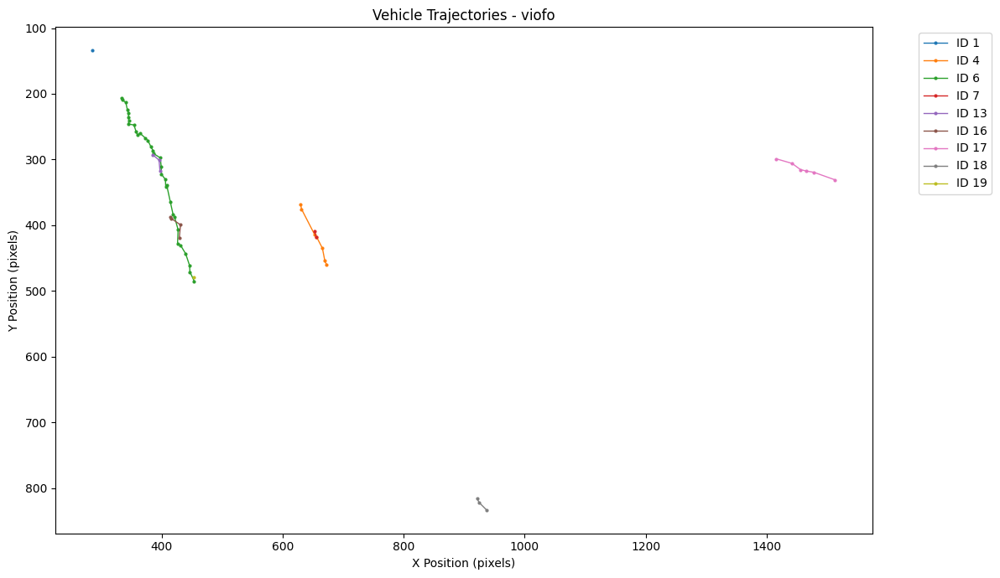

In [13]:
# ============================================
# CELL 13 - TRAJECTORY VISUALIZATION
# ============================================

plt.figure(figsize=(12, 7))

for track_id, group in trajectory_df.groupby(
    "track_id"
):

    plt.plot(
        group["center_x"],
        group["center_y"],
        marker="o",
        markersize=2,
        linewidth=1,
        label=f"ID {track_id}"
    )

plt.gca().invert_yaxis()

plt.title(
    f"Vehicle Trajectories - {camera_name}"
)

plt.xlabel("X Position (pixels)")
plt.ylabel("Y Position (pixels)")

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left"
)

plt.tight_layout()
plt.show()

In [14]:
# ============================================
# CELL 14 - SAVE TRACKING DATA
# ============================================

tracking_output_path = (
    OUTPUT_DIR /
    f"{camera_name}_tracking.csv"
)

tracks_df.to_csv(
    tracking_output_path,
    index=False
)

summary_output_path = (
    OUTPUT_DIR /
    f"{camera_name}_vehicle_summary.csv"
)

vehicle_summary.to_csv(
    summary_output_path,
    index=False
)

print(
    "Tracking data saved:"
)

print(
    tracking_output_path
)

print(
    summary_output_path
)

Tracking data saved:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\viofo_tracking.csv
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\viofo_vehicle_summary.csv


In [15]:
# ============================================
# CELL 15 - MULTI-CAMERA VEHICLE TRACKING
# ============================================

all_camera_tracks = []

for video_path in video_files:

    camera_name = video_path.stem

    print("\n================================")
    print("Processing:", video_path.name)
    print("================================")

    cap = cv2.VideoCapture(
        str(video_path)
    )

    if not cap.isOpened():
        print(
            "Could not open:",
            video_path.name
        )
        continue

    frame_count = 0
    max_frames = 300

    camera_records = []

    while frame_count < max_frames:

        success, frame = cap.read()

        if not success:
            break

        results = vehicle_model.track(
            source=frame,
            persist=True,
            tracker="bytetrack.yaml",
            conf=0.20,
            imgsz=640,
            verbose=False
        )

        result = results[0]

        if (
            result.boxes is not None
            and len(result.boxes) > 0
            and result.boxes.id is not None
        ):

            boxes = (
                result.boxes.xyxy
                .cpu()
                .numpy()
            )

            classes = (
                result.boxes.cls
                .cpu()
                .numpy()
            )

            track_ids = (
                result.boxes.id
                .cpu()
                .numpy()
                .astype(int)
            )

            for box, cls, track_id in zip(
                boxes,
                classes,
                track_ids
            ):

                class_name = (
                    vehicle_model.names[
                        int(cls)
                    ]
                )

                # Keep only our vehicle classes
                if class_name not in VEHICLE_CLASSES:
                    continue

                x1, y1, x2, y2 = (
                    box.astype(int)
                )

                camera_records.append({
                    "camera": camera_name,
                    "frame": frame_count,
                    "track_id": int(track_id),
                    "vehicle_type": class_name,
                    "x1": x1,
                    "y1": y1,
                    "x2": x2,
                    "y2": y2
                })

        frame_count += 1

    cap.release()

    camera_df = pd.DataFrame(
        camera_records
    )

    if not camera_df.empty:

        all_camera_tracks.append(
            camera_df
        )

    print(
        "Frames processed:",
        frame_count
    )

    print(
        "Tracking records:",
        len(camera_df)
    )

    if not camera_df.empty:
        print(
            "Unique track IDs:",
            camera_df["track_id"].nunique()
        )


if not all_camera_tracks:
    raise RuntimeError(
        "No tracking data generated."
    )

multi_camera_df = pd.concat(
    all_camera_tracks,
    ignore_index=True
)

# Globally unique per-camera vehicle ID
multi_camera_df["vehicle_id"] = (
    multi_camera_df["camera"]
    + "_"
    + multi_camera_df["track_id"]
    .astype(str)
)

print("\n================================")
print("MULTI-CAMERA TRACKING COMPLETE")
print("================================")

print(
    "Total records:",
    len(multi_camera_df)
)

print(
    "Cameras:",
    multi_camera_df["camera"].nunique()
)

print(
    "Unique vehicle tracks:",
    multi_camera_df["vehicle_id"].nunique()
)

display(
    multi_camera_df.head(15)
)


Processing: cam_1.mp4
Frames processed: 300
Tracking records: 67
Unique track IDs: 5

Processing: North-East.mp4
Frames processed: 300
Tracking records: 254
Unique track IDs: 12

Processing: viofo.mp4
Frames processed: 223
Tracking records: 288
Unique track IDs: 21

MULTI-CAMERA TRACKING COMPLETE
Total records: 609
Cameras: 3
Unique vehicle tracks: 38


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,vehicle_id
0,cam_1,41,21,Truck,390,0,1021,530,cam_1_21
1,cam_1,42,21,Truck,381,0,1022,537,cam_1_21
2,cam_1,43,21,Truck,374,0,1021,543,cam_1_21
3,cam_1,45,21,Truck,357,0,1022,559,cam_1_21
4,cam_1,49,21,Truck,326,0,1012,579,cam_1_21
5,cam_1,50,21,Truck,318,0,1012,586,cam_1_21
6,cam_1,51,21,Truck,310,0,1014,597,cam_1_21
7,cam_1,52,21,Truck,299,0,1016,610,cam_1_21
8,cam_1,53,21,Truck,292,0,1015,619,cam_1_21
9,cam_1,54,21,Truck,286,0,1011,623,cam_1_21


In [16]:
# ============================================
# CELL 16 - MULTI-CAMERA CENTER POINTS
# ============================================

multi_camera_df["center_x"] = (
    multi_camera_df["x1"] +
    multi_camera_df["x2"]
) / 2

multi_camera_df["center_y"] = (
    multi_camera_df["y1"] +
    multi_camera_df["y2"]
) / 2

# Use actual FPS of each camera
multi_camera_df["time_sec"] = 0.0

for camera_name in multi_camera_df["camera"].unique():

    fps = video_info[camera_name]["fps"]

    mask = (
        multi_camera_df["camera"] == camera_name
    )

    multi_camera_df.loc[
        mask,
        "time_sec"
    ] = (
        multi_camera_df.loc[
            mask,
            "frame"
        ] / fps
    )

print("Multi-camera center points calculated.")
print("\nActual FPS used:")

for camera_name in multi_camera_df["camera"].unique():
    print(
        f"{camera_name}: "
        f"{video_info[camera_name]['fps']:.2f} FPS"
    )

display(
    multi_camera_df[
        [
            "camera",
            "frame",
            "track_id",
            "vehicle_id",
            "vehicle_type",
            "center_x",
            "center_y",
            "time_sec"
        ]
    ].head(15)
)

Multi-camera center points calculated.

Actual FPS used:
cam_1: 25.00 FPS
North-East: 30.00 FPS
viofo: 10.00 FPS


,camera,frame,track_id,vehicle_id,vehicle_type,center_x,center_y,time_sec
0,cam_1,41,21,cam_1_21,Truck,705.5,265.0,1.64
1,cam_1,42,21,cam_1_21,Truck,701.5,268.5,1.68
2,cam_1,43,21,cam_1_21,Truck,697.5,271.5,1.72
3,cam_1,45,21,cam_1_21,Truck,689.5,279.5,1.80
4,cam_1,49,21,cam_1_21,Truck,669.0,289.5,1.96
5,cam_1,50,21,cam_1_21,Truck,665.0,293.0,2.00
6,cam_1,51,21,cam_1_21,Truck,662.0,298.5,2.04
7,cam_1,52,21,cam_1_21,Truck,657.5,305.0,2.08
8,cam_1,53,21,cam_1_21,Truck,653.5,309.5,2.12
9,cam_1,54,21,cam_1_21,Truck,648.5,311.5,2.16


In [17]:
# ============================================
# CELL 17 - MULTI-CAMERA TRAJECTORIES
# ============================================

multi_trajectory_df = (
    multi_camera_df
    .sort_values(
        ["camera", "track_id", "frame"]
    )
    .copy()
)

multi_trajectory_df["previous_x"] = (
    multi_trajectory_df
    .groupby(
        ["camera", "track_id"]
    )["center_x"]
    .shift(1)
)

multi_trajectory_df["previous_y"] = (
    multi_trajectory_df
    .groupby(
        ["camera", "track_id"]
    )["center_y"]
    .shift(1)
)

multi_trajectory_df["movement_pixels"] = np.sqrt(
    (
        multi_trajectory_df["center_x"]
        - multi_trajectory_df["previous_x"]
    ) ** 2
    +
    (
        multi_trajectory_df["center_y"]
        - multi_trajectory_df["previous_y"]
    ) ** 2
)

multi_trajectory_df[
    "movement_pixels"
] = multi_trajectory_df[
    "movement_pixels"
].fillna(0)

print("Multi-camera trajectories created.")

display(
    multi_trajectory_df.head(10)
)

Multi-camera trajectories created.


,camera,frame,track_id,vehicle_type,x1,y1,x2,y2,vehicle_id,center_x,center_y,time_sec,previous_x,previous_y,movement_pixels
67,North-East,12,40,Car,972,289,1605,886,North-East_40,1288.5,587.5,0.400000,NaN,NaN,0.000000
68,North-East,13,40,Car,978,293,1600,879,North-East_40,1289.0,586.0,0.433333,1288.5,587.5,1.581139
69,North-East,15,41,Car,1679,437,1919,821,North-East_41,1799.0,629.0,0.500000,NaN,NaN,0.000000
70,North-East,16,41,Car,1671,434,1919,830,North-East_41,1795.0,632.0,0.533333,1799.0,629.0,5.000000
71,North-East,17,41,Car,1664,430,1917,834,North-East_41,1790.5,632.0,0.566667,1795.0,632.0,4.500000
72,North-East,18,41,Car,1656,428,1915,842,North-East_41,1785.5,635.0,0.600000,1790.5,632.0,5.830952
73,North-East,19,41,Car,1646,425,1909,844,North-East_41,1777.5,634.5,0.633333,1785.5,635.0,8.015610
74,North-East,20,41,Car,1635,423,1906,852,North-East_41,1770.5,637.5,0.666667,1777.5,634.5,7.615773
75,North-East,21,41,Car,1628,421,1903,852,North-East_41,1765.5,636.5,0.700000,1770.5,637.5,5.099020
76,North-East,22,41,Car,1620,419,1901,856,North-East_41,1760.5,637.5,0.733333,1765.5,636.5,5.099020


In [18]:
# ============================================
# CELL 18 - CAMERA-WISE VEHICLE COUNT
# ============================================

camera_vehicle_count = (
    multi_camera_df
    .groupby("camera")["vehicle_id"]
    .nunique()
    .reset_index(
        name="unique_vehicles"
    )
)

print("Unique vehicles tracked per camera:")

display(
    camera_vehicle_count
)

Unique vehicles tracked per camera:


,camera,unique_vehicles
0,North-East,12
1,cam_1,5
2,viofo,21


In [19]:
# ============================================
# CELL 19 - VEHICLE TYPE ANALYSIS
# ============================================

vehicle_type_analysis = (
    multi_camera_df[
        [
            "camera",
            "vehicle_id",
            "vehicle_type"
        ]
    ]
    .drop_duplicates()
    .groupby(
        ["camera", "vehicle_type"]
    )
    .size()
    .reset_index(
        name="unique_vehicles"
    )
)

print("Vehicle type distribution by camera:")

display(
    vehicle_type_analysis
)

Vehicle type distribution by camera:


,camera,vehicle_type,unique_vehicles
0,North-East,Car,10
1,North-East,Truck,4
2,cam_1,Ambulance,1
3,cam_1,Car,3
4,cam_1,Truck,4
5,viofo,Ambulance,1
6,viofo,Bus,7
7,viofo,Car,17
8,viofo,Truck,1


In [20]:
# ============================================
# CELL 20 - TRAFFIC DENSITY
# ============================================

traffic_density = (
    multi_camera_df
    .groupby(
        ["camera", "frame"]
    )["track_id"]
    .nunique()
    .reset_index(
        name="vehicles_in_frame"
    )
)

print("Traffic density calculated.")

display(
    traffic_density.head(20)
)

Traffic density calculated.


,camera,frame,vehicles_in_frame
0,North-East,12,1
1,North-East,13,1
2,North-East,15,1
3,North-East,16,1
4,North-East,17,1
5,North-East,18,1
6,North-East,19,1
7,North-East,20,1
8,North-East,21,1
9,North-East,22,1


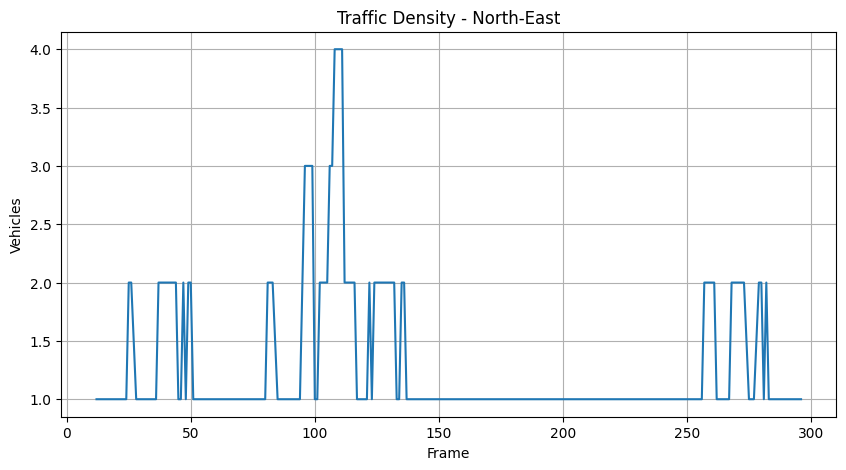

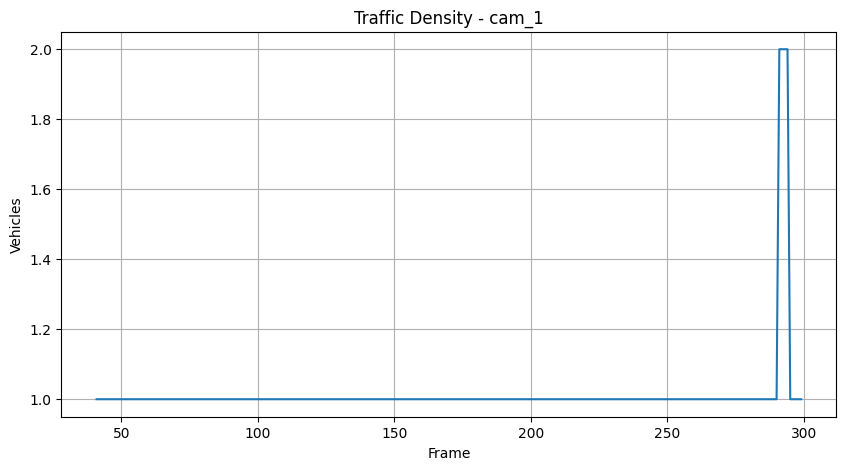

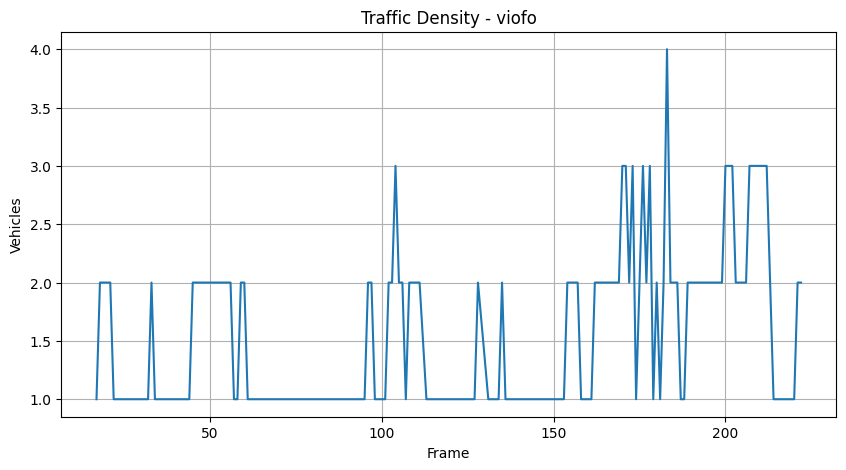

In [21]:
# ============================================
# CELL 21 - TRAFFIC DENSITY VISUALIZATION
# ============================================

for camera_name in traffic_density["camera"].unique():

    camera_data = traffic_density[
        traffic_density["camera"] == camera_name
    ]

    plt.figure(figsize=(10, 5))

    plt.plot(
        camera_data["frame"],
        camera_data["vehicles_in_frame"]
    )

    plt.xlabel("Frame")
    plt.ylabel("Vehicles")

    plt.title(
        f"Traffic Density - {camera_name}"
    )

    plt.grid(True)

    plt.show()

In [22]:
# ============================================
# CELL 22 - SAVE MULTI-CAMERA DATA
# ============================================

multi_camera_csv = (
    OUTPUT_DIR /
    "multi_camera_tracking.csv"
)

multi_trajectory_df.to_csv(
    multi_camera_csv,
    index=False
)

camera_summary_csv = (
    OUTPUT_DIR /
    "camera_vehicle_summary.csv"
)

camera_vehicle_count.to_csv(
    camera_summary_csv,
    index=False
)

print("Files saved:")
print(multi_camera_csv)
print(camera_summary_csv)

Files saved:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\multi_camera_tracking.csv
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\camera_vehicle_summary.csv


In [23]:
# ============================================
# CELL 23 - CAMERA TRAFFIC SUMMARY
# ============================================

camera_summary = (
    multi_camera_df
    .groupby("camera")
    .agg(
        total_detections=(
            "vehicle_id",
            "count"
        ),

        unique_vehicles=(
            "vehicle_id",
            "nunique"
        )
    )
    .reset_index()
)

# Average vehicles visible per frame
average_per_frame = (
    traffic_density
    .groupby("camera")["vehicles_in_frame"]
    .mean()
    .reset_index(
        name="avg_vehicles_per_frame"
    )
)

camera_summary = camera_summary.merge(
    average_per_frame,
    on="camera",
    how="left"
)

print("Camera-wise traffic summary:")

display(camera_summary)

Camera-wise traffic summary:


,camera,total_detections,unique_vehicles,avg_vehicles_per_frame
0,North-East,254,12,1.426966
1,cam_1,67,5,1.063492
2,viofo,288,21,1.540107


In [24]:
# ============================================
# CELL 24 - MOVEMENT / SPEED PROXY
# ============================================

speed_proxy = (
    multi_trajectory_df
    .groupby(
        ["camera", "track_id"]
    )
    .agg(
        first_time=("time_sec", "min"),
        last_time=("time_sec", "max"),

        total_distance_pixels=(
            "movement_pixels",
            "sum"
        ),

        observations=(
            "frame",
            "count"
        )
    )
    .reset_index()
)

speed_proxy["duration_sec"] = (
    speed_proxy["last_time"]
    - speed_proxy["first_time"]
)

speed_proxy["pixel_speed"] = np.where(
    speed_proxy["duration_sec"] > 0,

    speed_proxy["total_distance_pixels"]
    / speed_proxy["duration_sec"],

    0
)

print("Movement / speed proxy calculated.")
print(
    "Note: This is pixel movement per second, "
    "not calibrated km/h."
)

display(
    speed_proxy.head(20)
)

Movement / speed proxy calculated.
Note: This is pixel movement per second, not calibrated km/h.


,camera,track_id,first_time,last_time,total_distance_pixels,observations,duration_sec,pixel_speed
0,North-East,40,0.400000,0.433333,1.581139,2,0.033333,47.434165
1,North-East,41,0.500000,1.866667,302.939072,41,1.366667,221.662735
2,North-East,42,0.833333,0.866667,6.800735,2,0.033333,204.022058
3,North-East,45,1.233333,1.666667,37.579787,11,0.433333,86.722585
4,North-East,47,2.133333,3.733333,545.177096,45,1.600000,340.735685
5,North-East,50,2.700000,2.766667,17.557263,3,0.066667,263.358941
6,North-East,54,3.166667,4.700000,225.174034,44,1.533333,146.852631
7,North-East,55,3.200000,5.766667,290.655553,34,2.566667,113.242423
8,North-East,56,3.533333,3.700000,27.857845,6,0.166667,167.147071
9,North-East,60,6.233333,6.366667,9.553893,4,0.133333,71.654199


In [25]:
# ============================================
# CELL 25 - CAMERA SPEED ANALYSIS
# ============================================

camera_speed = (
    speed_proxy
    .groupby("camera")["pixel_speed"]
    .mean()
    .reset_index(
        name="average_pixel_speed"
    )
)

print("Average movement speed by camera:")

display(camera_speed)

Average movement speed by camera:


,camera,average_pixel_speed
0,North-East,174.807921
1,cam_1,206.308998
2,viofo,112.569715


In [26]:
# ============================================
# CELL 26 - TRAFFIC DENSITY SUMMARY
# ============================================

density_summary = (
    traffic_density
    .groupby("camera")["vehicles_in_frame"]
    .agg(
        average_density="mean",
        maximum_density="max",
        minimum_density="min"
    )
    .reset_index()
)

print("Traffic density summary:")

display(density_summary)

Traffic density summary:


,camera,average_density,maximum_density,minimum_density
0,North-East,1.426966,4,1
1,cam_1,1.063492,2,1
2,viofo,1.540107,4,1


In [27]:
# ============================================
# CELL 27 - CONGESTION INDICATOR
# ============================================

density_threshold = (
    density_summary["average_density"]
    .median()
)

density_summary["traffic_status"] = np.where(
    density_summary["average_density"]
    >= density_threshold,
    "HIGH",
    "NORMAL"
)

print(
    "Traffic density threshold:",
    round(density_threshold, 2)
)

display(
    density_summary
)

Traffic density threshold: 1.43


,camera,average_density,maximum_density,minimum_density,traffic_status
0,North-East,1.426966,4,1,HIGH
1,cam_1,1.063492,2,1,NORMAL
2,viofo,1.540107,4,1,HIGH


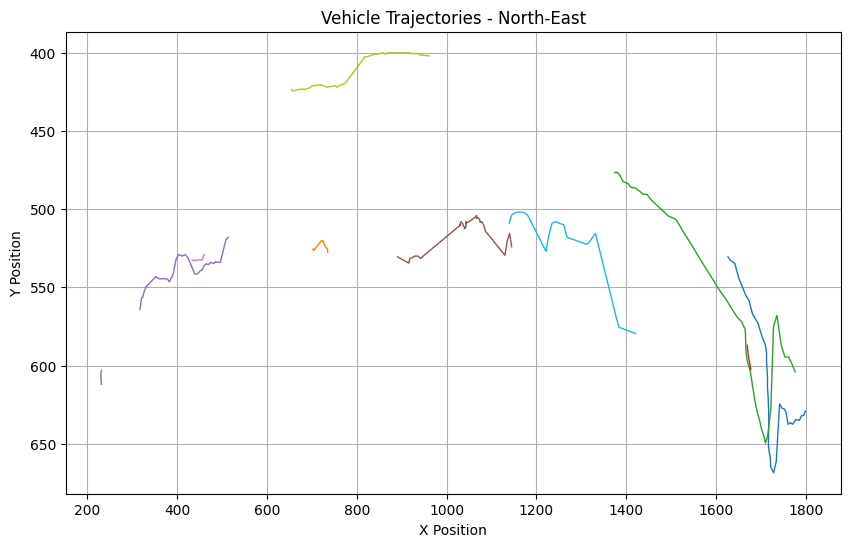

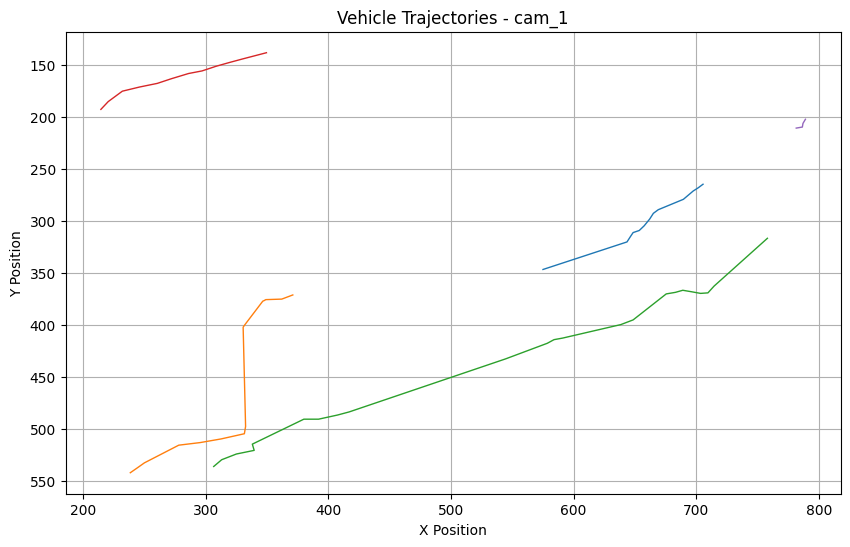

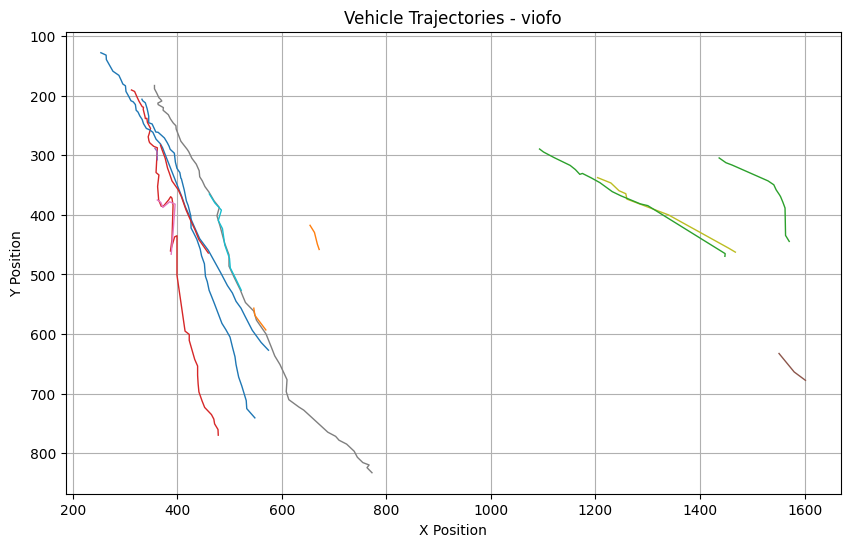

In [28]:
# ============================================
# CELL 28 - MULTI-CAMERA TRAJECTORY VIEW
# ============================================

for camera_name in (
    multi_trajectory_df["camera"].unique()
):

    camera_data = multi_trajectory_df[
        multi_trajectory_df["camera"] == camera_name
    ]

    plt.figure(figsize=(10, 6))

    for track_id in (
        camera_data["track_id"]
        .unique()
    ):

        vehicle_path = camera_data[
            camera_data["track_id"] == track_id
        ]

        if len(vehicle_path) < 3:
            continue

        plt.plot(
            vehicle_path["center_x"],
            vehicle_path["center_y"],
            linewidth=1
        )

    plt.gca().invert_yaxis()

    plt.xlabel("X Position")
    plt.ylabel("Y Position")

    plt.title(
        f"Vehicle Trajectories - {camera_name}"
    )

    plt.grid(True)
    plt.show()

In [29]:
# ============================================
# CELL 29 - SAVE TRAFFIC ANALYTICS
# ============================================

camera_summary.to_csv(
    OUTPUT_DIR / "camera_traffic_summary.csv",
    index=False
)

camera_speed.to_csv(
    OUTPUT_DIR / "camera_speed_analysis.csv",
    index=False
)

density_summary.to_csv(
    OUTPUT_DIR / "traffic_density_summary.csv",
    index=False
)

speed_proxy.to_csv(
    OUTPUT_DIR / "vehicle_speed_proxy.csv",
    index=False
)

print("Traffic analytics saved successfully.")

Traffic analytics saved successfully.


In [30]:
# ============================================
# CELL 30 - LOAD NUMBER PLATE DETECTION MODEL
# ============================================

from ultralytics import YOLO

PLATE_MODEL_PATH = MODELS_DIR / "number_plate_detection_best.pt"

if not PLATE_MODEL_PATH.exists():
    raise FileNotFoundError(
        f"Plate detection model not found:\n{PLATE_MODEL_PATH}"
    )

plate_model = YOLO(str(PLATE_MODEL_PATH))

print("Number plate detection model loaded successfully.")
print("Model:", PLATE_MODEL_PATH)

print("\nPlate model classes:")
print(plate_model.names)

Number plate detection model loaded successfully.
Model: C:\Users\lenovo\downloads\ANPR_Traffic_AI\models\number_plate_detection_best.pt

Plate model classes:
{0: 'plate'}


In [31]:
# ============================================
# CELL 31 - LOAD EASYOCR
# ============================================

import easyocr

reader = easyocr.Reader(
    ['en'],
    gpu=False
)

print("EasyOCR loaded successfully.")
print("Device: CPU")

Using CPU. Note: This module is much faster with a GPU.


EasyOCR loaded successfully.
Device: CPU


C:\Users\lenovo\AppData\Roaming\Python\Python313\site-packages\torch\ao\nn\quantized\dynamic\modules\rnn.py:162: UserWarning: torch.quantize_per_tensor, torch.quantize_per_channel and other quantized tensor creation functions that produce tensors with dtype torch.quint8, torch.qint8, and torch.qint32 are deprecated and will be removed in a future PyTorch release. Please see https://github.com/pytorch/pytorch/issues/184982 for more information. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\aten\src\ATen\quantized\Quantizer.cpp:116.)
  w_ih = torch.quantize_per_tensor(


In [32]:
# ============================================
# CELL 32 - OCR TEXT CLEANING
# ============================================

import re

def clean_plate_text(text):

    text = text.upper()

    # Remove spaces and special characters
    text = re.sub(
        r'[^A-Z0-9]',
        '',
        text
    )

    return text


print("OCR text cleaning function ready.")

OCR text cleaning function ready.


In [33]:
# ============================================
# CELL 33 - IMPROVED PLATE OCR FUNCTION
# ============================================

def normalize_ocr_text(text):

    if not isinstance(text, str):
        return ""

    text = text.upper().strip()

    text = re.sub(
        r"[^A-Z0-9]",
        "",
        text
    )

    return text


def plate_format_score(text):

    if not text:
        return 0

    score = 0

    if 6 <= len(text) <= 12:
        score += 2

    if re.search(r"[A-Z]", text):
        score += 1

    if re.search(r"[0-9]", text):
        score += 1

    if re.match(r"^[A-Z]{2}", text):
        score += 2

    if re.search(r"[A-Z]{2}[0-9]{1,2}", text):
        score += 1

    return score


def bbox_center_x(bbox):

    return float(
        np.mean(
            [point[0] for point in bbox]
        )
    )


def combine_ocr_results(results):

    if not results:
        return "", 0.0

    valid_results = []

    for bbox, text, confidence in results:

        cleaned = normalize_ocr_text(text)

        if not cleaned:
            continue

        valid_results.append(
            (
                bbox,
                cleaned,
                float(confidence)
            )
        )

    if not valid_results:
        return "", 0.0

    # Left → right
    valid_results.sort(
        key=lambda item:
        bbox_center_x(item[0])
    )

    combined_text = "".join(
        item[1]
        for item in valid_results
    )

    confidence = float(
        np.mean(
            [
                item[2]
                for item in valid_results
            ]
        )
    )

    return combined_text, confidence


def make_ocr_variants_from_crop(plate_crop):

    if plate_crop is None:
        return []

    if plate_crop.size == 0:
        return []

    # Upscale
    image = cv2.resize(
        plate_crop,
        None,
        fx=3,
        fy=3,
        interpolation=cv2.INTER_CUBIC
    )

    gray = cv2.cvtColor(
        image,
        cv2.COLOR_BGR2GRAY
    )

    # CLAHE
    clahe = cv2.createCLAHE(
        clipLimit=2.0,
        tileGridSize=(8, 8)
    )

    clahe_img = clahe.apply(gray)

    # Adaptive threshold
    threshold = cv2.adaptiveThreshold(
        clahe_img,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        31,
        11
    )

    return [
        image,
        gray,
        clahe_img,
        threshold
    ]


def read_plate_text(plate_crop):

    variants = make_ocr_variants_from_crop(
        plate_crop
    )

    candidates = []

    for variant_index, variant in enumerate(
        variants
    ):

        try:

            results = reader.readtext(
                variant,
                detail=1,
                paragraph=False,
                allowlist=(
                    "ABCDEFGHIJKLMNOPQRSTUVWXYZ"
                    "0123456789"
                )
            )

        except Exception:
            continue

        if not results:
            continue

        combined_text, confidence = (
            combine_ocr_results(results)
        )

        if not combined_text:
            continue

        if len(combined_text) < 4:
            continue

        format_score = plate_format_score(
            combined_text
        )

        score = (
            confidence * 2.0
            +
            format_score * 0.35
        )

        candidates.append(
            {
                "text": combined_text,
                "confidence": confidence,
                "format_score": format_score,
                "variant": variant_index,
                "score": score
            }
        )

    if not candidates:
        return "", 0.0

    # Consensus bonus
    for candidate in candidates:

        same_count = sum(
            1
            for other in candidates
            if other["text"]
            == candidate["text"]
        )

        candidate["score"] += (
            same_count * 0.75
        )

    candidates.sort(
        key=lambda x: x["score"],
        reverse=True
    )

    best = candidates[0]

    return (
        best["text"],
        float(best["confidence"])
    )


print(
    "Improved plate OCR function ready."
)

Improved plate OCR function ready.


In [34]:
# ============================================
# CELL 34 - MATCH PLATE WITH VEHICLE
# ============================================

def plate_inside_vehicle(
    plate_box,
    vehicle_box
):

    px1, py1, px2, py2 = plate_box
    vx1, vy1, vx2, vy2 = vehicle_box

    plate_center_x = (
        px1 + px2
    ) / 2

    plate_center_y = (
        py1 + py2
    ) / 2

    return (
        vx1 <= plate_center_x <= vx2
        and
        vy1 <= plate_center_y <= vy2
    )


print("Plate-vehicle matching function ready.")

Plate-vehicle matching function ready.


Testing Vehicle -> Plate detection...
Video: viofo.mp4


C:\Users\lenovo\AppData\Roaming\Python\Python313\site-packages\torch\utils\data\dataloader.py:759: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)



PLATE DETECTION TEST COMPLETE
Frames tested : 115
Plates found  : 7
Plate crops   : C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\plate_crops


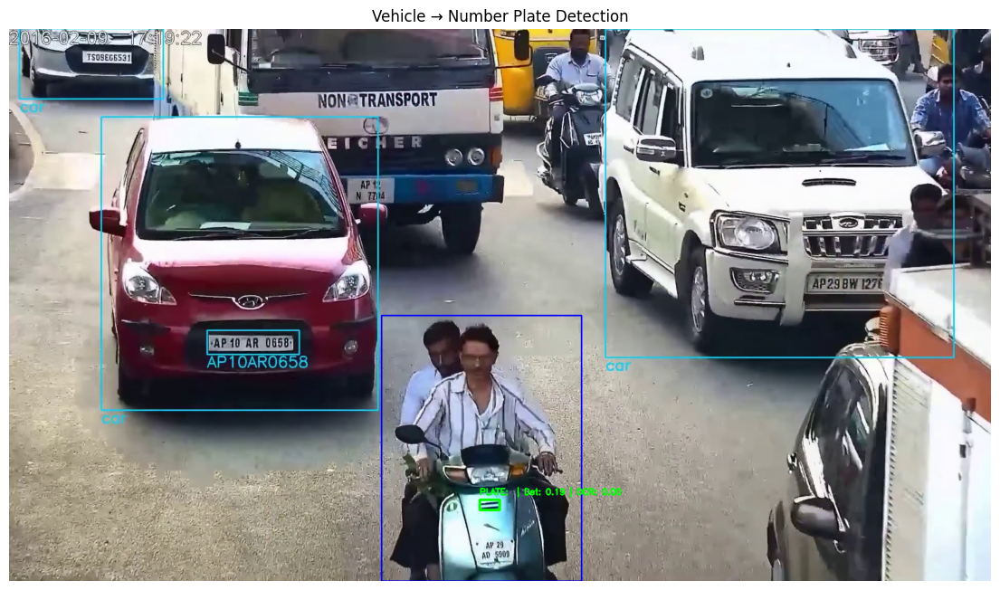

Example plate crop:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\plate_crops\viofo_frame49_plate1.jpg


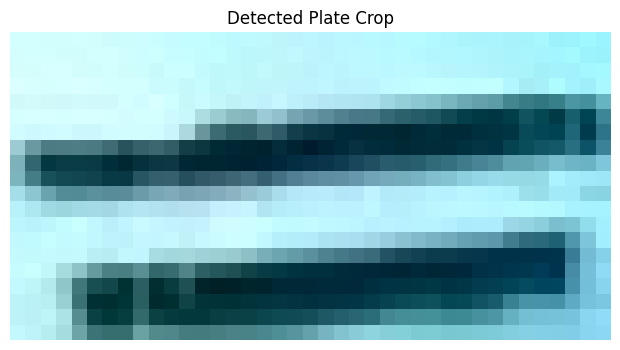

In [35]:
# ============================================
# CELL 35 - VEHICLE -> PLATE DETECTION TEST
# ============================================

import cv2
import matplotlib.pyplot as plt
from pathlib import Path

PLATE_DEBUG_DIR = OUTPUT_DIR / "plate_debug"
PLATE_CROP_DIR = OUTPUT_DIR / "plate_crops"

PLATE_DEBUG_DIR.mkdir(parents=True, exist_ok=True)
PLATE_CROP_DIR.mkdir(parents=True, exist_ok=True)

print("Testing Vehicle -> Plate detection...")
print("Video:", TEST_VIDEO.name)

cap = cv2.VideoCapture(str(TEST_VIDEO))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {TEST_VIDEO}")

found_plates = 0
tested_frames = 0
best_result = None

MAX_TEST_FRAMES = 120

while tested_frames < MAX_TEST_FRAMES:

    success, frame = cap.read()

    if not success:
        break

    tested_frames += 1

    # ----------------------------------------
    # STEP 1: VEHICLE DETECTION
    # ----------------------------------------

    vehicle_results = vehicle_model.predict(
        source=frame,
        conf=0.20,
        imgsz=640,
        verbose=False
    )

    vehicle_result = vehicle_results[0]

    if (
        vehicle_result.boxes is None
        or len(vehicle_result.boxes) == 0
    ):
        continue

    vehicle_boxes = (
        vehicle_result.boxes
        .xyxy
        .cpu()
        .numpy()
    )

    annotated = frame.copy()

    frame_plate_count = 0

    # ----------------------------------------
    # STEP 2: PLATE DETECTION INSIDE VEHICLE
    # ----------------------------------------

    for vehicle_index, vehicle_box in enumerate(vehicle_boxes):

        vx1, vy1, vx2, vy2 = vehicle_box.astype(int)

        vx1 = max(0, vx1)
        vy1 = max(0, vy1)
        vx2 = min(frame.shape[1], vx2)
        vy2 = min(frame.shape[0], vy2)

        vehicle_crop = frame[
            vy1:vy2,
            vx1:vx2
        ]

        if vehicle_crop.size == 0:
            continue

        # Plate model runs on VEHICLE CROP
        plate_results = plate_model.predict(
            source=vehicle_crop,
            conf=0.10,
            imgsz=1280,
            verbose=False
        )

        plate_result = plate_results[0]

        if (
            plate_result.boxes is None
            or len(plate_result.boxes) == 0
        ):
            continue

        plate_boxes = (
            plate_result.boxes
            .xyxy
            .cpu()
            .numpy()
        )

        plate_confs = (
            plate_result.boxes
            .conf
            .cpu()
            .numpy()
        )

        for plate_box, plate_conf in zip(
            plate_boxes,
            plate_confs
        ):

            # Coordinates relative to vehicle crop
            px1, py1, px2, py2 = (
                plate_box.astype(int)
            )

            # Convert back to original frame
            fx1 = vx1 + px1
            fy1 = vy1 + py1
            fx2 = vx1 + px2
            fy2 = vy1 + py2

            fx1 = max(0, fx1)
            fy1 = max(0, fy1)
            fx2 = min(frame.shape[1], fx2)
            fy2 = min(frame.shape[0], fy2)

            plate_crop = frame[
                fy1:fy2,
                fx1:fx2
            ]

            if plate_crop.size == 0:
                continue

            found_plates += 1
            frame_plate_count += 1

            # OCR
            text, ocr_conf = read_plate_text(
                plate_crop
            )

            # Draw vehicle
            cv2.rectangle(
                annotated,
                (vx1, vy1),
                (vx2, vy2),
                (255, 0, 0),
                2
            )

            # Draw plate
            cv2.rectangle(
                annotated,
                (fx1, fy1),
                (fx2, fy2),
                (0, 255, 0),
                3
            )

            label = (
                f"PLATE: {text} "
                f"| Det: {float(plate_conf):.2f} "
                f"| OCR: {ocr_conf:.2f}"
            )

            cv2.putText(
                annotated,
                label,
                (fx1, max(25, fy1 - 10)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.55,
                (0, 255, 0),
                2
            )

            # Save actual plate crop
            crop_path = (
                PLATE_CROP_DIR /
                f"{TEST_VIDEO.stem}_frame{tested_frames}_plate{found_plates}.jpg"
            )

            cv2.imwrite(
                str(crop_path),
                plate_crop
            )

            # Keep best frame for display
            if best_result is None:
                best_result = (
                    annotated.copy(),
                    crop_path
                )

    # Save first useful annotated frame
    if frame_plate_count > 0:

        debug_path = (
            PLATE_DEBUG_DIR /
            f"{TEST_VIDEO.stem}_frame{tested_frames}_plates.jpg"
        )

        cv2.imwrite(
            str(debug_path),
            annotated
        )

        # Stop once we have enough examples
        if found_plates >= 6:
            break

cap.release()

print("\n===================================")
print("PLATE DETECTION TEST COMPLETE")
print("===================================")
print("Frames tested :", tested_frames)
print("Plates found  :", found_plates)
print("Plate crops   :", PLATE_CROP_DIR)

# ----------------------------------------
# SHOW RESULT
# ----------------------------------------

if best_result is not None:

    annotated_image, crop_path = best_result

    plt.figure(figsize=(14, 8))

    plt.imshow(
        cv2.cvtColor(
            annotated_image,
            cv2.COLOR_BGR2RGB
        )
    )

    plt.axis("off")
    plt.title(
        "Vehicle → Number Plate Detection"
    )

    plt.show()

    print("Example plate crop:")
    print(crop_path)

    plate_img = cv2.imread(str(crop_path))

    if plate_img is not None:

        plt.figure(figsize=(10, 4))

        plt.imshow(
            cv2.cvtColor(
                plate_img,
                cv2.COLOR_BGR2RGB
            )
        )

        plt.axis("off")
        plt.title("Detected Plate Crop")

        plt.show()

else:

    print("\n❌ NO PLATE DETECTED.")
    print("Do NOT run the full video processing yet.")

Frames selected: 6
Frame 0: 16 detections
Confidences: [    0.15931     0.12128    0.061682     0.05676    0.051072    0.047163    0.044194     0.02943    0.028937    0.020029    0.019714     0.01954    0.018893    0.013683    0.012435    0.011954]
Boxes: [[     249.16      126.73       372.2      171.33]
 [     232.32      124.27      370.83      169.95]
 [     241.51      130.32      372.79      167.02]
 [     25.785      234.15      189.24      322.98]
 [     1234.5      519.02      1452.5      599.44]
 [     1142.5      519.06      1235.7      599.62]
 [     969.82       513.8      1128.8      549.63]
 [     1223.2      520.05      1445.2      597.94]
 [      250.2      120.83      371.55      176.79]
 [     1222.4      505.91      1456.2      602.38]
 [     234.95      123.37      373.78      176.72]
 [     1855.3      146.13        1920      179.35]
 [     1236.7      502.42      1457.2      603.55]
 [     1246.1      517.91      1455.6      602.77]
 [     1217.1      507.95     

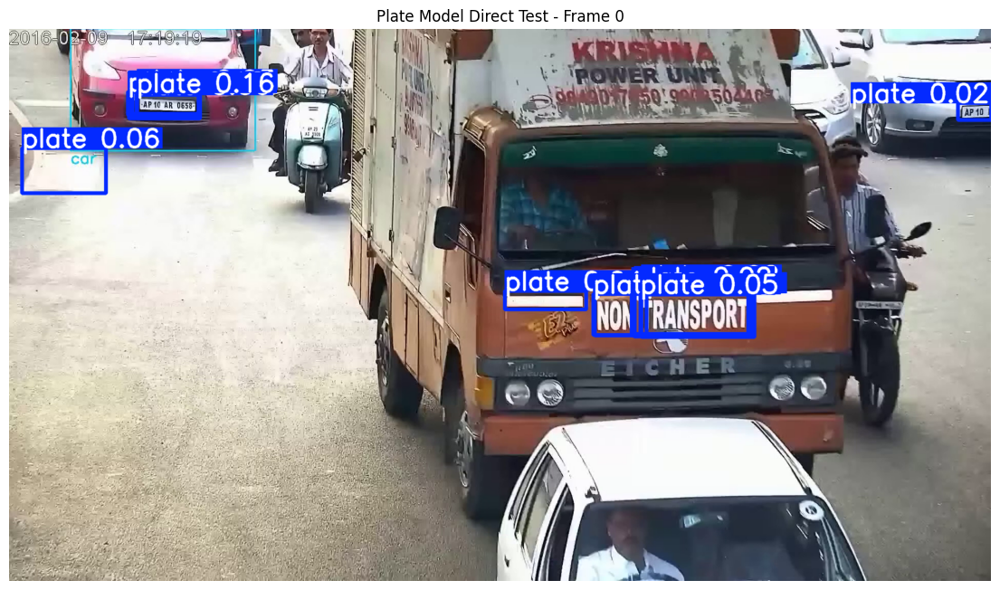

Frame 5: 15 detections
Confidences: [    0.72915     0.14457     0.13775     0.11427     0.03535     0.03458    0.032044    0.029629    0.023714    0.020764    0.014388    0.013026    0.011514    0.011141    0.010091]
Boxes: [[     249.19      149.97      398.43      206.68]
 [     1370.3      884.41      1490.8      930.62]
 [       1373      880.86      1494.1      934.53]
 [     249.13      155.91      393.19      201.06]
 [     1378.3      632.05      1612.1      714.65]
 [     1375.8      634.05      1611.9       713.4]
 [     533.61      174.75      653.06      272.65]
 [     251.44      153.55      396.39      201.13]
 [     1289.1      627.54        1386      719.16]
 [     252.34      143.29      400.25      210.21]
 [     1381.5      620.04      1615.6      719.82]
 [     254.06      151.33      400.67      208.61]
 [     1101.9      621.77      1273.6      666.27]
 [     1140.3         652      1264.5       733.7]
 [     1288.8      632.64      1382.8      713.58]]


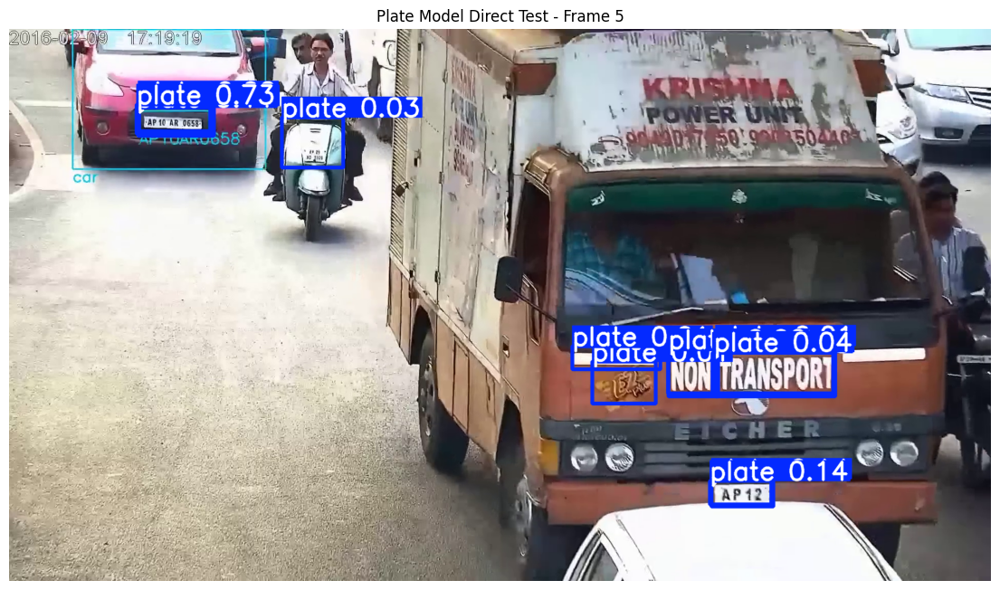

Frame 10: 19 detections
Confidences: [     0.6827     0.37815     0.30964     0.17883     0.13548    0.047967    0.044904    0.023322    0.022787    0.022578    0.021509    0.020716    0.020414    0.017644    0.017264    0.014842    0.013068    0.012175    0.011912]
Boxes: [[     247.88      190.76      406.01      246.58]
 [     1509.8      1007.4      1657.2        1080]
 [     1510.5      998.01      1659.4        1080]
 [     1423.2      751.31      1524.5      844.67]
 [     247.31      184.04      406.06      251.73]
 [     247.18      193.27      396.88      241.09]
 [     1511.9      1005.2      1656.6        1080]
 [       1271      771.33      1399.8      866.29]
 [     1510.9      1009.8        1653      1079.4]
 [     1267.4      777.65      1399.3      864.05]
 [     248.56      201.43      393.71      243.25]
 [     249.75      187.46      409.64      251.52]
 [     249.62      175.08      407.99      255.07]
 [     1521.1      757.06      1701.8      843.33]
 [     1420.

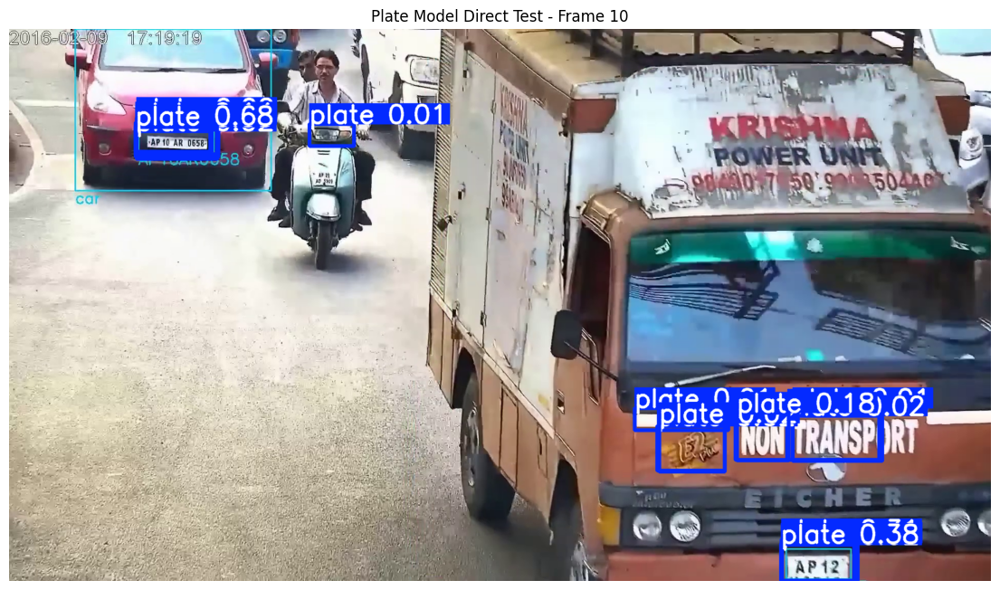

Frame 15: 12 detections
Confidences: [    0.51089     0.42069    0.065682    0.059548    0.056176    0.047762    0.042396    0.020707    0.013653    0.013291    0.011245     0.01118]
Boxes: [[     261.49      219.92      426.82      282.46]
 [     260.17      226.31      418.77       278.5]
 [       1574      884.75        1681      988.17]
 [     1405.7      917.66      1542.1      1006.7]
 [     1338.7       497.7      1509.8         583]
 [     261.37      226.97      415.93      270.89]
 [     263.04      225.25      424.31      278.76]
 [     607.33      375.83      683.61      438.07]
 [     821.23      23.094      930.02      166.26]
 [          0           0      137.13      42.053]
 [       1409      907.38      1542.9      1010.1]
 [     1405.1      917.15      1540.3        1004]]


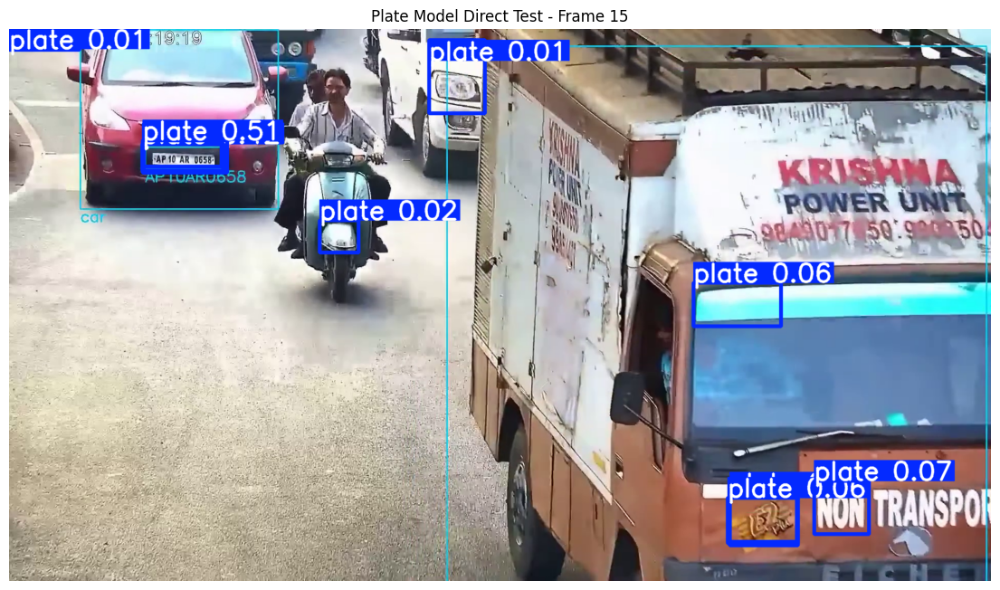

Frame 20: 9 detections
Confidences: [    0.43421     0.34738    0.071487    0.035236    0.033075    0.017989    0.014961    0.012911    0.012391]
Boxes: [[     288.43      275.78      422.77      313.77]
 [     288.98      272.72      424.73      318.88]
 [     289.69      265.33      428.61      323.57]
 [      290.6      272.32      428.82      319.25]
 [     648.55      404.24      714.93      453.69]
 [     276.83      274.77       429.3      313.92]
 [     1496.3      629.96      1698.4      725.91]
 [     648.95       405.7      709.71      452.28]
 [     1495.6      635.35      1658.5      723.87]]


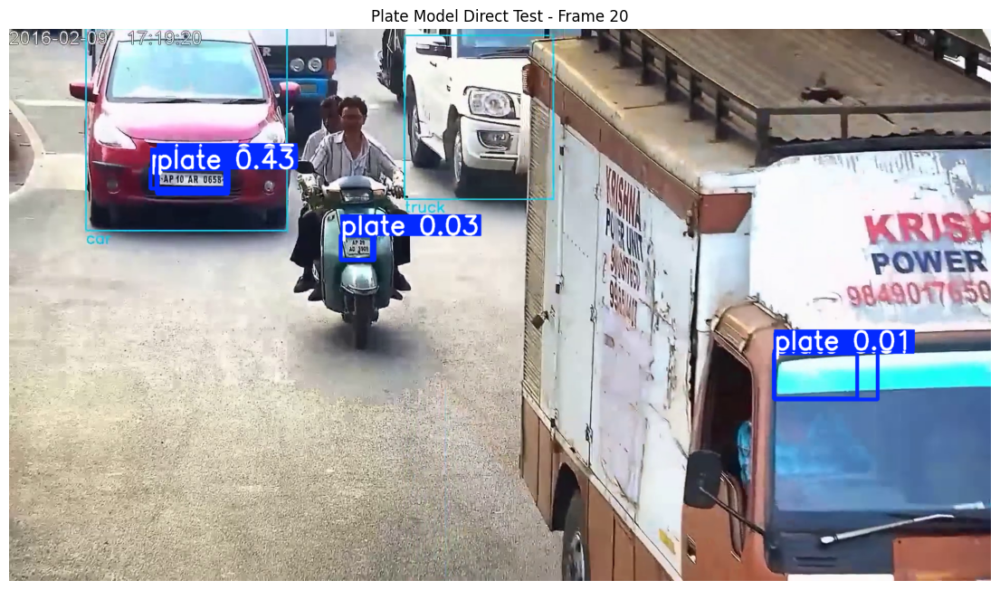

Frame 25: 7 detections
Confidences: [    0.88463     0.09422    0.047067    0.017789     0.01609     0.01486    0.011339]
Boxes: [[     292.54      294.24      464.43      356.52]
 [     293.52      301.69      448.42      351.21]
 [     293.86      286.96      465.34      359.19]
 [     1648.7      765.52      1826.9      857.47]
 [     950.98      128.93      1083.8      232.09]
 [     294.42      297.55       460.7       352.8]
 [     294.62      295.15      464.31       360.2]]


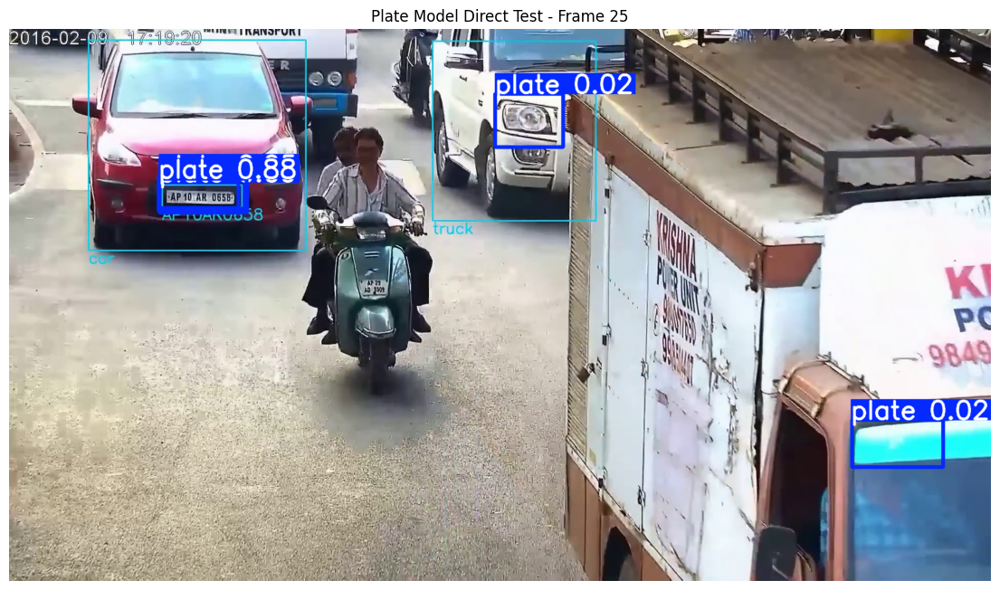

In [36]:
# ============================================
# DIAGNOSTIC - TEST PLATE MODEL DIRECTLY
# ============================================

import cv2
import matplotlib.pyplot as plt

cap = cv2.VideoCapture(str(TEST_VIDEO))

if not cap.isOpened():
    raise RuntimeError(f"Could not open video: {TEST_VIDEO}")

# Read a few frames
test_frames = []

for i in range(30):
    success, frame = cap.read()

    if not success:
        break

    if i in [0, 5, 10, 15, 20, 25]:
        test_frames.append((i, frame.copy()))

cap.release()

print("Frames selected:", len(test_frames))

# --------------------------------------------
# Run PLATE MODEL directly on full frames
# --------------------------------------------

for frame_no, frame in test_frames:

    results = plate_model.predict(
        source=frame,
        conf=0.01,
        imgsz=1280,
        verbose=False
    )

    result = results[0]

    annotated = result.plot()

    print(
        f"Frame {frame_no}: "
        f"{len(result.boxes) if result.boxes is not None else 0} detections"
    )

    if result.boxes is not None and len(result.boxes) > 0:

        print(
            "Confidences:",
            result.boxes.conf.cpu().numpy()
        )

        print(
            "Boxes:",
            result.boxes.xyxy.cpu().numpy()
        )

    plt.figure(figsize=(14, 8))

    plt.imshow(
        cv2.cvtColor(
            annotated,
            cv2.COLOR_BGR2RGB
        )
    )

    plt.title(
        f"Plate Model Direct Test - Frame {frame_no}"
    )

    plt.axis("off")
    plt.show()

In [38]:
# ============================================
# CELL 36 - FINAL MULTI-CAMERA ANPR
# ============================================

OCR_INTERVAL = 10

# Testing mode
MAX_FRAMES_PER_VIDEO = None

final_records = []

for video_path in video_files:

    camera_name = video_path.stem

    print("\n===================================")
    print("Processing camera:", video_path.name)
    print("===================================")

    cap = cv2.VideoCapture(
        str(video_path)
    )

    if not cap.isOpened():
        print("Could not open:", video_path.name)
        continue

    camera_fps = video_info[
        camera_name
    ]["fps"]

    frame_count = 0

    # OCR cache per vehicle
    last_ocr = {}

    while (
        MAX_FRAMES_PER_VIDEO is None
        or frame_count < MAX_FRAMES_PER_VIDEO
    ):

        success, frame = cap.read()

        if not success:
            break

        # ====================================
        # 1. VEHICLE TRACKING
        # ====================================

        vehicle_results = vehicle_model.track(
            source=frame,
            persist=True,
            tracker="bytetrack.yaml",
            conf=0.20,
            imgsz=640,
            verbose=False
        )

        vehicle_result = vehicle_results[0]

        vehicle_data = []

        if (
            vehicle_result.boxes is not None
            and len(vehicle_result.boxes) > 0
            and vehicle_result.boxes.id is not None
        ):

            boxes = (
                vehicle_result.boxes
                .xyxy
                .cpu()
                .numpy()
            )

            classes = (
                vehicle_result.boxes.cls
                .cpu()
                .numpy()
            )

            track_ids = (
                vehicle_result.boxes.id
                .cpu()
                .numpy()
                .astype(int)
            )

            for box, cls, track_id in zip(
                boxes,
                classes,
                track_ids
            ):

                class_name = (
                    vehicle_model.names[
                        int(cls)
                    ]
                )

                if class_name not in VEHICLE_CLASSES:
                    continue

                vehicle_data.append({
                    "box": box.astype(int),
                    "track_id": int(track_id),
                    "vehicle_type": class_name
                })

        # ====================================
        # 2. PLATE DETECTION INSIDE VEHICLES
        # ====================================

        for vehicle in vehicle_data:

            vx1, vy1, vx2, vy2 = (
                vehicle["box"]
            )

            vx1 = max(0, vx1)
            vy1 = max(0, vy1)

            vx2 = min(
                frame.shape[1],
                vx2
            )

            vy2 = min(
                frame.shape[0],
                vy2
            )

            vehicle_crop = frame[
                vy1:vy2,
                vx1:vx2
            ]

            if vehicle_crop.size == 0:
                continue

            plate_results = plate_model.predict(
                source=vehicle_crop,
                conf=0.10,
                imgsz=1280,
                verbose=False
            )

            plate_result = plate_results[0]

            if (
                plate_result.boxes is None
                or len(plate_result.boxes) == 0
            ):
                continue

            plate_boxes = (
                plate_result.boxes
                .xyxy
                .cpu()
                .numpy()
            )

            plate_confs = (
                plate_result.boxes.conf
                .cpu()
                .numpy()
            )

            # --------------------------------
            # Process detected plates
            # --------------------------------

            for plate_box, plate_conf in zip(
                plate_boxes,
                plate_confs
            ):

                # Plate coordinates are relative
                # to vehicle crop
                px1, py1, px2, py2 = (
                    plate_box.astype(int)
                )

                # Convert to original frame
                fx1 = vx1 + px1
                fy1 = vy1 + py1
                fx2 = vx1 + px2
                fy2 = vy1 + py2

                fx1 = max(0, fx1)
                fy1 = max(0, fy1)

                fx2 = min(
                    frame.shape[1],
                    fx2
                )

                fy2 = min(
                    frame.shape[0],
                    fy2
                )

                if (
                    fx2 <= fx1
                    or fy2 <= fy1
                ):
                    continue

                plate_crop = frame[
                    fy1:fy2,
                    fx1:fx2
                ]

                if plate_crop.size == 0:
                    continue

                track_id = vehicle["track_id"]

                if track_id < 0:
                    continue

                vehicle_type = (
                    vehicle["vehicle_type"]
                )

                vehicle_id = (
                    f"{camera_name}_{track_id}"
                )

                # =================================
                # OCR CACHE
                # =================================

                use_ocr = (
                    vehicle_id not in last_ocr
                    or
                    frame_count
                    - last_ocr[
                        vehicle_id
                    ]["frame"]
                    >= OCR_INTERVAL
                )

                if use_ocr:

                    plate_text, ocr_confidence = (
                        read_plate_text(
                            plate_crop
                        )
                    )

                    last_ocr[
                        vehicle_id
                    ] = {
                        "frame": frame_count,
                        "plate_text": plate_text,
                        "ocr_confidence":
                            float(
                                ocr_confidence
                            )
                    }

                else:

                    cached = last_ocr[
                        vehicle_id
                    ]

                    plate_text = (
                        cached["plate_text"]
                    )

                    ocr_confidence = (
                        cached["ocr_confidence"]
                    )

                # =================================
                # SAVE RESULT
                # =================================

                final_records.append({

                    "camera":
                        camera_name,

                    "frame":
                        frame_count,

                    "time_sec":
                        frame_count /
                        camera_fps,

                    "vehicle_id":
                        vehicle_id,

                    "track_id":
                        track_id,

                    "vehicle_type":
                        vehicle_type,

                    "plate_text":
                        plate_text,

                    "plate_confidence":
                        float(
                            plate_conf
                        ),

                    "ocr_confidence":
                        float(
                            ocr_confidence
                        ),

                    "plate_x1":
                        fx1,

                    "plate_y1":
                        fy1,

                    "plate_x2":
                        fx2,

                    "plate_y2":
                        fy2
                })

        frame_count += 1

    cap.release()

    print(
        "Frames processed:",
        frame_count
    )

print("\n===================================")
print("MULTI-CAMERA ANPR COMPLETE")
print("===================================")

print(
    "Total ANPR records:",
    len(final_records)
)

print(
    "Cameras:",
    len(set(
        r["camera"]
        for r in final_records
    ))
)


Processing camera: cam_1.mp4
Frames processed: 615

Processing camera: North-East.mp4
Frames processed: 1799

Processing camera: viofo.mp4
Frames processed: 223

MULTI-CAMERA ANPR COMPLETE
Total ANPR records: 327
Cameras: 3


In [39]:
# ============================================
# CELL 37 - FINAL ANPR DATAFRAME
# ============================================

anpr_df = pd.DataFrame(
    final_records
)

if anpr_df.empty:

    print(
        "⚠️ No ANPR records were generated."
    )

else:

    print(
        "ANPR records:",
        len(anpr_df)
    )

    print(
        "Cameras:",
        anpr_df["camera"].nunique()
    )

    print(
        "Unique vehicle IDs:",
        anpr_df["vehicle_id"].nunique()
    )

    print(
        "Unique vehicle types:",
        anpr_df["vehicle_type"].nunique()
    )

    print("\nVehicle types:")
    print(
        anpr_df["vehicle_type"]
        .value_counts()
    )

    print("\nSample ANPR records:")

    display(
        anpr_df.head(20)
    )

ANPR records: 327
Cameras: 3
Unique vehicle IDs: 31
Unique vehicle types: 4

Vehicle types:
vehicle_type
Car          133
Truck        125
Bus           68
Ambulance      1
Name: count, dtype: int64

Sample ANPR records:


,camera,frame,time_sec,vehicle_id,track_id,vehicle_type,plate_text,plate_confidence,ocr_confidence,plate_x1,plate_y1,plate_x2,plate_y2
0,cam_1,198,7.920000,cam_1_186,186,Truck,78015MK02,0.387485,0.625778,681,323,743,364
1,cam_1,205,8.200000,cam_1_186,186,Truck,78015MK02,0.214310,0.625778,633,380,700,422
2,cam_1,206,8.240000,cam_1_186,186,Truck,78015MK02,0.186249,0.625778,625,394,692,430
3,cam_1,206,8.240000,cam_1_186,186,Truck,78015MK02,0.138617,0.625778,625,391,692,433
4,cam_1,206,8.240000,cam_1_186,186,Truck,78015MK02,0.129182,0.625778,626,389,693,434
5,cam_1,207,8.280000,cam_1_186,186,Truck,78015MK02,0.240261,0.625778,618,401,684,437
6,cam_1,207,8.280000,cam_1_186,186,Truck,78015MK02,0.114972,0.625778,618,397,685,440
7,cam_1,208,8.320000,cam_1_186,186,Truck,M8015TK02,0.640356,0.315096,610,409,677,450
8,cam_1,209,8.360000,cam_1_186,186,Truck,M8015TK02,0.148573,0.315096,602,417,670,459
9,cam_1,210,8.400000,cam_1_186,186,Truck,M8015TK02,0.116154,0.315096,593,431,658,467


In [40]:
# ============================================
# CELL 38 - OCR CLEANING & QUALITY FILTER
# ============================================

import re

def normalize_plate(text):
    
    if not isinstance(text, str):
        return ""
    
    text = text.upper().strip()
    
    # Keep only A-Z and 0-9
    text = re.sub(
        r"[^A-Z0-9]",
        "",
        text
    )
    
    return text


anpr_df["clean_plate"] = (
    anpr_df["plate_text"]
    .apply(normalize_plate)
)

# Remove empty OCR results
ocr_clean_df = anpr_df[
    anpr_df["clean_plate"].str.len() >= 4
].copy()

# Remove very low OCR confidence
ocr_clean_df = ocr_clean_df[
    ocr_clean_df["ocr_confidence"] >= 0.10
].copy()

print("Total ANPR records :", len(anpr_df))
print("After OCR cleaning :", len(ocr_clean_df))

print("\nClean OCR results:")
display(
    ocr_clean_df[
        [
            "camera",
            "vehicle_id",
            "vehicle_type",
            "clean_plate",
            "plate_confidence",
            "ocr_confidence"
        ]
    ].head(30)
)

Total ANPR records : 327
After OCR cleaning : 227

Clean OCR results:


,camera,vehicle_id,vehicle_type,clean_plate,plate_confidence,ocr_confidence
0,cam_1,cam_1_186,Truck,78015MK02,0.387485,0.625778
1,cam_1,cam_1_186,Truck,78015MK02,0.214310,0.625778
2,cam_1,cam_1_186,Truck,78015MK02,0.186249,0.625778
3,cam_1,cam_1_186,Truck,78015MK02,0.138617,0.625778
4,cam_1,cam_1_186,Truck,78015MK02,0.129182,0.625778
5,cam_1,cam_1_186,Truck,78015MK02,0.240261,0.625778
6,cam_1,cam_1_186,Truck,78015MK02,0.114972,0.625778
7,cam_1,cam_1_186,Truck,M8015TK02,0.640356,0.315096
8,cam_1,cam_1_186,Truck,M8015TK02,0.148573,0.315096
9,cam_1,cam_1_186,Truck,M8015TK02,0.116154,0.315096


In [41]:
# ============================================
# DIAGNOSTIC - INSPECT PLATE CROPS
# ============================================

import matplotlib.pyplot as plt
import cv2
from pathlib import Path

debug_dir = PROJECT_DIR / "outputs" / "plate_debug"
debug_dir.mkdir(parents=True, exist_ok=True)

shown = 0

for video_path in video_files:

    cap = cv2.VideoCapture(str(video_path))

    if not cap.isOpened():
        continue

    frame_no = 0

    while frame_no < 100 and shown < 12:

        success, frame = cap.read()

        if not success:
            break

        frame_no += 1

        # Use vehicle model
        results = vehicle_model.predict(
            source=frame,
            conf=0.20,
            imgsz=640,
            verbose=False
        )

        result = results[0]

        if result.boxes is None or len(result.boxes) == 0:
            continue

        boxes = result.boxes.xyxy.cpu().numpy()

        for box in boxes:

            x1, y1, x2, y2 = map(int, box)

            x1 = max(0, x1)
            y1 = max(0, y1)
            x2 = min(frame.shape[1], x2)
            y2 = min(frame.shape[0], y2)

            crop = frame[y1:y2, x1:x2]

            if crop.size == 0:
                continue

            cv2.imwrite(
                str(
                    debug_dir /
                    f"{video_path.stem}_{frame_no}_{shown}.jpg"
                ),
                crop
            )

            shown += 1

            if shown >= 12:
                break

    cap.release()

print("Saved diagnostic vehicle crops:", shown)
print("Folder:", debug_dir)

Saved diagnostic vehicle crops: 12
Folder: C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\plate_debug


Images found: 59


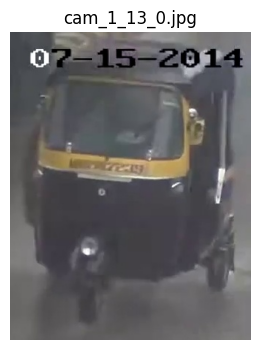

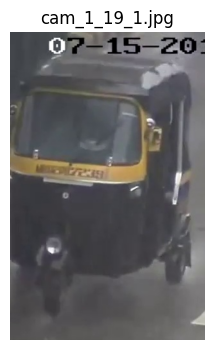

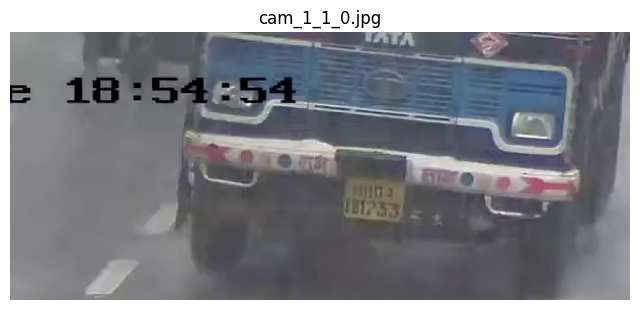

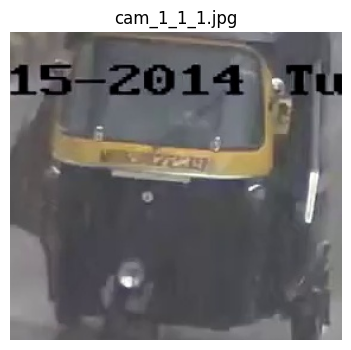

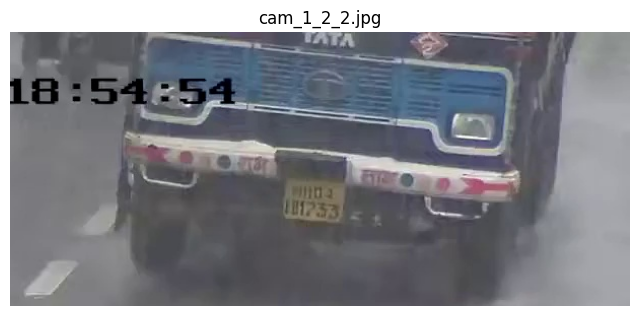

...

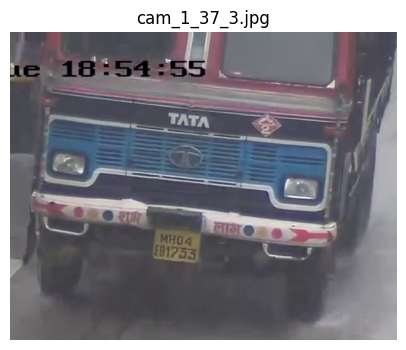

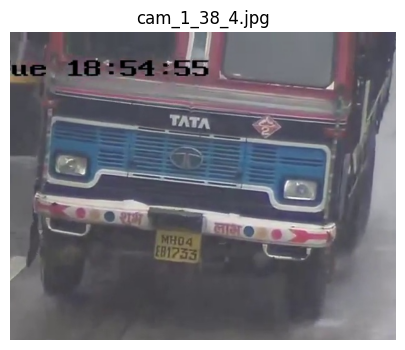

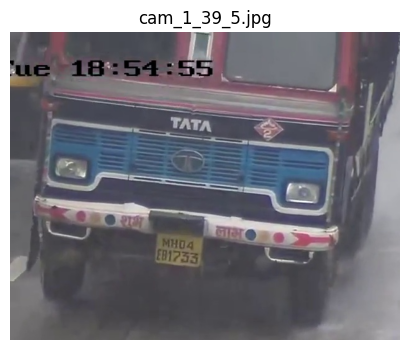

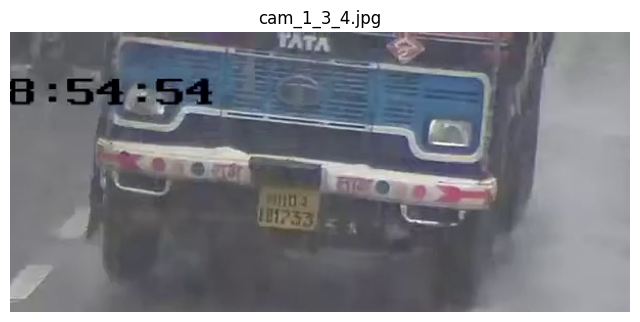

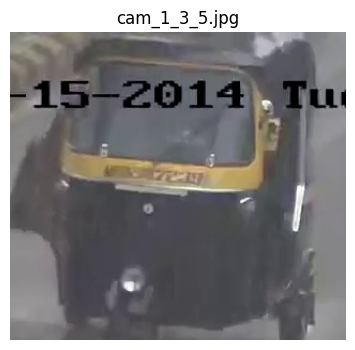

In [42]:
# ============================================
# SHOW DIAGNOSTIC CROPS
# ============================================

from PIL import Image
import matplotlib.pyplot as plt

debug_images = list(debug_dir.glob("*.jpg"))

print("Images found:", len(debug_images))

for img_path in debug_images[:12]:

    img = Image.open(img_path)

    plt.figure(figsize=(8, 4))
    plt.imshow(img)
    plt.title(img_path.name)
    plt.axis("off")
    plt.show()

In [43]:
# ============================================
# CELL 39 - VEHICLE-WISE OCR VOTING
# ============================================

if ocr_clean_df.empty:

    vehicle_ocr_summary = pd.DataFrame()

else:

    # Count how many times each plate was read
    plate_votes = (
        ocr_clean_df
        .groupby(
            [
                "camera",
                "vehicle_id",
                "clean_plate"
            ]
        )
        .agg(
            votes=("clean_plate", "size"),
            best_ocr_confidence=(
                "ocr_confidence",
                "max"
            ),
            best_plate_confidence=(
                "plate_confidence",
                "max"
            )
        )
        .reset_index()
    )

    # Combined score:
    # frequency + OCR confidence + detector confidence
    plate_votes["score"] = (
        plate_votes["votes"] * 0.50
        +
        plate_votes["best_ocr_confidence"] * 0.30
        +
        plate_votes["best_plate_confidence"] * 0.20
    )

    # Best candidate for each vehicle
    vehicle_ocr_summary = (
        plate_votes
        .sort_values(
            [
                "camera",
                "vehicle_id",
                "score"
            ],
            ascending=[
                True,
                True,
                False
            ]
        )
        .drop_duplicates(
            subset=[
                "camera",
                "vehicle_id"
            ]
        )
        .reset_index(drop=True)
    )

print(
    "Vehicles with OCR candidates:",
    len(vehicle_ocr_summary)
)

display(
    vehicle_ocr_summary
)

Vehicles with OCR candidates: 20


,camera,vehicle_id,clean_plate,votes,best_ocr_confidence,best_plate_confidence,score
0,North-East,North-East_225,EKA0FLPIGLHY,4,0.247890,0.397943,2.153956
1,North-East,North-East_230,46250,18,0.594463,0.565190,9.291377
2,North-East,North-East_239,3250,17,0.852604,0.283506,8.812482
3,North-East,North-East_241,63250,7,0.742621,0.376407,3.798068
4,North-East,North-East_252,FKAQLADISZ4,3,0.242775,0.128986,1.598630
5,North-East,North-East_257,PI6LKAI,6,0.796553,0.375507,3.314067
6,North-East,North-East_261,ILKG,2,0.196284,0.118963,1.082678
7,North-East,North-East_263,MAO4,4,0.173548,0.117941,2.075653
8,North-East,North-East_267,FOI6EI,1,0.151961,0.107520,0.567092
9,North-East,North-East_284,DERSALURUSARIO,29,0.355209,0.700151,14.746593


In [44]:
# ============================================
# CELL 40 - PLATE FORMAT VALIDATION
# ============================================

def looks_like_indian_plate(text):

    if not isinstance(text, str):
        return False

    text = text.upper()

    # Normal Indian registration plates
    # usually contain both letters and digits.
    has_letter = bool(
        re.search(r"[A-Z]", text)
    )

    has_digit = bool(
        re.search(r"[0-9]", text)
    )

    # Reasonable length range
    valid_length = (
        6 <= len(text) <= 12
    )

    return (
        has_letter
        and has_digit
        and valid_length
    )


vehicle_ocr_summary[
    "format_valid"
] = (
    vehicle_ocr_summary["clean_plate"]
    .apply(looks_like_indian_plate)
)

final_vehicle_plates = (
    vehicle_ocr_summary[
        vehicle_ocr_summary["format_valid"]
    ]
    .copy()
)

print(
    "Format-valid vehicle plates:",
    len(final_vehicle_plates)
)

display(
    final_vehicle_plates[
        [
            "camera",
            "vehicle_id",
            "clean_plate",
            "votes",
            "best_ocr_confidence",
            "best_plate_confidence",
            "score"
        ]
    ]
)

Format-valid vehicle plates: 8


,camera,vehicle_id,clean_plate,votes,best_ocr_confidence,best_plate_confidence,score
0,North-East,North-East_225,EKA0FLPIGLHY,4,0.247890,0.397943,2.153956
4,North-East,North-East_252,FKAQLADISZ4,3,0.242775,0.128986,1.598630
5,North-East,North-East_257,PI6LKAI,6,0.796553,0.375507,3.314067
8,North-East,North-East_267,FOI6EI,1,0.151961,0.107520,0.567092
12,cam_1,cam_1_186,78015MK02,7,0.625778,0.387485,3.765230
14,viofo,viofo_405,AP29AGIJJ,1,0.263970,0.140878,0.607366
15,viofo,viofo_407,AP29AG1358,3,0.818992,0.193861,1.784470
17,viofo,viofo_418,AP99CC,16,0.198697,0.623466,8.184302


In [45]:
# ============================================
# CELL 41 - FINAL VEHICLE → PLATE RESULTS
# ============================================

print("==========================================")
print("FINAL VEHICLE → NUMBER PLATE RESULTS")
print("==========================================")

if final_vehicle_plates.empty:

    print(
        "⚠️ No reliable plate was identified."
    )

else:

    final_vehicle_plates = (
        final_vehicle_plates
        .sort_values(
            "score",
            ascending=False
        )
        .reset_index(drop=True)
    )

    print(
        "Reliable vehicle-plate mappings:",
        len(final_vehicle_plates)
    )

    display(
        final_vehicle_plates[
            [
                "camera",
                "vehicle_id",
                "clean_plate",
                "votes",
                "best_ocr_confidence",
                "best_plate_confidence",
                "score"
            ]
        ]
    )

FINAL VEHICLE → NUMBER PLATE RESULTS
Reliable vehicle-plate mappings: 8


,camera,vehicle_id,clean_plate,votes,best_ocr_confidence,best_plate_confidence,score
0,viofo,viofo_418,AP99CC,16,0.198697,0.623466,8.184302
1,cam_1,cam_1_186,78015MK02,7,0.625778,0.387485,3.765230
2,North-East,North-East_257,PI6LKAI,6,0.796553,0.375507,3.314067
3,North-East,North-East_225,EKA0FLPIGLHY,4,0.247890,0.397943,2.153956
4,viofo,viofo_407,AP29AG1358,3,0.818992,0.193861,1.784470
5,North-East,North-East_252,FKAQLADISZ4,3,0.242775,0.128986,1.598630
6,viofo,viofo_405,AP29AGIJJ,1,0.263970,0.140878,0.607366
7,North-East,North-East_267,FOI6EI,1,0.151961,0.107520,0.567092


In [46]:
# ============================================
# CELL 42 - SAVE FINAL ANPR RESULTS
# ============================================

final_output_path = (
    OUTPUT_DIR /
    "final_vehicle_plate_results.csv"
)

final_vehicle_plates[
    [
        "camera",
        "vehicle_id",
        "clean_plate",
        "votes",
        "best_ocr_confidence",
        "best_plate_confidence",
        "score"
    ]
].to_csv(
    final_output_path,
    index=False
)

print(
    "Final ANPR results saved to:"
)

print(
    final_output_path
)

Final ANPR results saved to:
C:\Users\lenovo\downloads\ANPR_Traffic_AI\outputs\final_vehicle_plate_results.csv
